In [121]:
suppressPackageStartupMessages({
    suppressWarnings({
        library(Seurat, quietly = T)
        library(openxlsx, quietly = T)
        library(ggpubr, quietly = T)
        library(plyr, quietly = T)
        library(dplyr, quietly = T)
        library(reshape2)
        library(textshape)
        library(tidyr)
        library(stringr)
        library(RColorBrewer, quietly = T)
        library(DescTools, quietly = T)
        library(hdWGCNA, quietly = T)
    })
})

source('./utility_functions.r')

Allowing parallel execution with up to 30 working processes.


In [2]:
server = 'mando'
if (server == 'jabba'){
    data_path = '/data3/hratch/norcross_abc/'
}else if (server == 'mando'){
    data_path = '/data/hratch/norcross_abc/'
}

# Visualizing key genes

In [194]:
calc_gini<-function(so, gene, assay = 'RNA', slot = 'data', condition = NULL){
    if (!(is.null(condition))){
    cell.barcodes<-row.names(so@meta.data[so@meta.data$orig.ident == condition,])
    }else{
        cell.barcodes<-row.names(so@meta.data)
    }

    vals<-sort(GetAssayData(so, assay=assay, slot=slot)[gene, cell.barcodes])
    gini.coef=DescTools::Gini(vals)
    
    tot_counts<-sum(vals)
    res<-data.frame(share.of.counts = cumsum(vals)/tot_counts)
    tot_cells<-dim(res)[[1]]
    res[['share.of.cells']] = (1:tot_cells)/tot_cells

    annotation <- data.frame(
       x = c(0.25),
       y = c(0.95),
       label = c(paste0('Gini coefficient: ', format(round(gini.coef, 3), nsmall = 3)))
    )
    
    g<-ggplot(res, aes(x = share.of.cells)) + geom_line(aes(y = share.of.counts), color = 'red') + 
    geom_line(aes(y = share.of.cells), color = 'black') + theme_bw() + 
    ggtitle(gene) + theme(plot.title = element_text(hjust = 0.5)) + 
    geom_text(data=annotation, aes(x=x, y=y, label=label),                 , 
           size=5)

    return(list(gini.coef = gini.coef, plot = g))

}

In [122]:
abc.tcells<-readRDS(paste0(data_path, 'processed/abc_tcells.RDS'))
Idents(abc.tcells)<-'Cell.Type.Level2'

Get metacells in case smoothing for Gini coefficient:

To do this, we will use the PCA embeddings. From the [second round of annotation](../01_process_data/01Bii_CellType_Annotation_round2.ipynb), we used 30 PCs for abc.tcells, so lets subset to this first 30 dimensions:

In [161]:
n_pcs<-30
t_pca<-Embeddings(abc.tcells, reduction = 'pca')[, 1:n_pcs]
abc.tcells[['pca']]<-CreateDimReducObject(embeddings = t_pca, 
                    assay = 'RNA', key = 'PC_')

In [ ]:
abc.tcells.meta<-get.metacells(abc.tcells, #min_cells = 25, k = 25, 
                               group.by = c("Cell.Type.Level2", 'orig.ident'), ident.group = "Cell.Type.Level2")

Finally, let's also exclude the aCD4_ABC condition:

In [163]:
abc.tcells.noacd4 = subset(abc.tcells, orig.ident != 'aCD4_ABC')

# md<-abc.tcells.meta@meta.data
# abc.tcells.noacd4.meta<-abc.tcells.meta[, rownames(md[md$orig.ident != 'aCD4_ABC',])]

Let's visualize the following genes:

In [238]:
genes<-c('Ifitm1', 'Ifitm2', 'Ifitm3', 'Ifit1', 'Ifit3', 'Nme1', 
         'Isg20', 'Oasl2', 'Isg15', 'Gzmb', 'Gzma')

Some of the genes are ubiquitously distributed across cell types, whereas others seem to be more cell type specific. To quantify this, we will calculate the Gini coefficient. A Gini coefficient of 0 indicates that the genes are completely evenly distributed across cells, whereas a Gini coefficient of 1 indicates that the genes are highly specific to [one] cell. Let's take a look at an example:

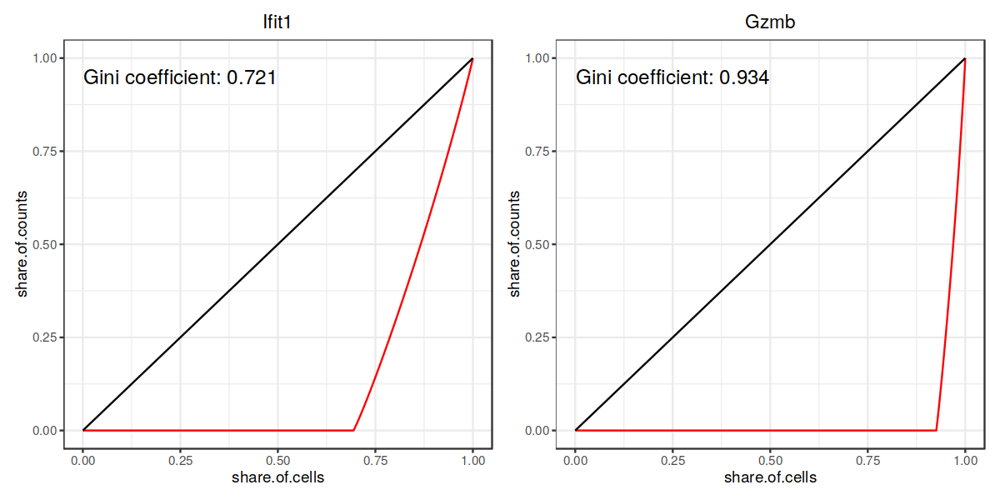

In [195]:
h_ = 5
w_ = 10
options(repr.plot.height=h_, repr.plot.width=w_)

res.Ifit1<-calc_gini(so = abc.tcells, gene = 'Ifit1')
res.Gzmb<-calc_gini(so = abc.tcells, gene = 'Gzmb')
res.Ifit1$plot + res.Gzmb$plot


We can see that Gzmb is much less evenly distributed than Ifit1 (see Feature Plots below). 
However, due to the nature of single-cell RNAseq, the number of cells with 0 counts dominates these plots. We may want to address this by smoothing the counts across metacells, as done above using hdWGCNA. 

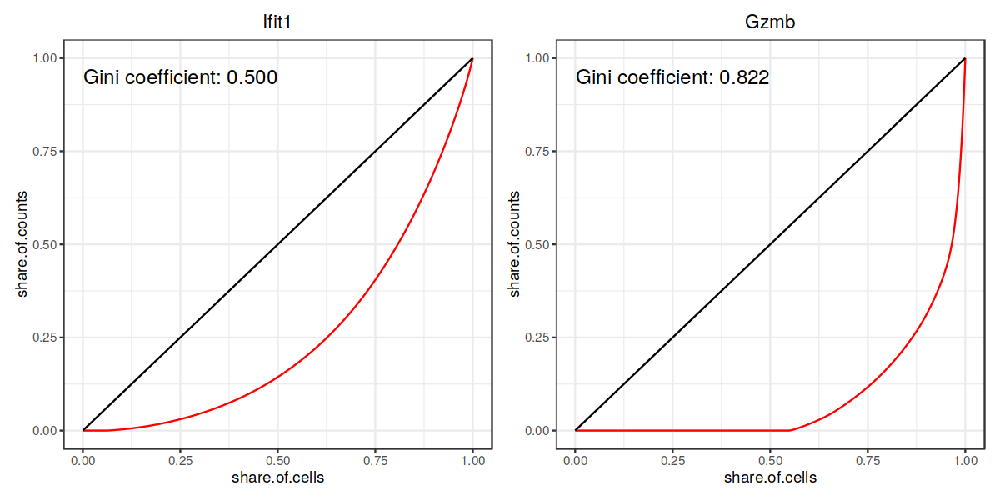

In [196]:
h_ = 5
w_ = 10
options(repr.plot.height=h_, repr.plot.width=w_)

res.Ifit1<-calc_gini(so = abc.tcells.meta, gene = 'Ifit1')
res.Gzmb<-calc_gini(so = abc.tcells.meta, gene = 'Gzmb')
res.Ifit1$plot + res.Gzmb$plot

Let's take a look at the FeaturePlots and ViolinPlots for each gene of interest:

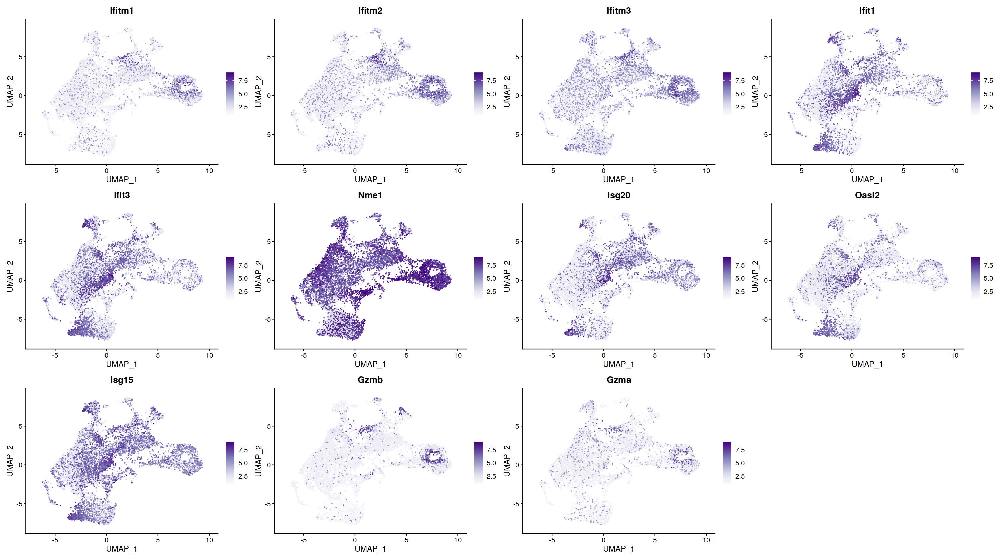

In [239]:
h_ = 14
w_ = 25
options(repr.plot.height=h_, repr.plot.width=w_)

g<-FeaturePlot(abc.tcells, features = genes, slot = 'scale.data', label = F, 
           cols =  brewer.pal(n = 9, name = "Purples"))

for (ext in c('.svg', '.png', '.pdf')){
    fn<-paste0(data_path, 'figures/', 'FeaturePlots', ext)
    ggsave(fn, g, height = h_, width = w_)}

g

The Gini coefficients are:

In [240]:
sapply(genes, function(gene) calc_gini(so = abc.tcells.meta, gene = gene)$gini.coef)

Ifitm1    Ifitm2    Ifitm3     Ifit1     Ifit3      Nme1     Isg20     Oasl2 
0.6900521 0.6007248 0.4843570 0.4997616 0.5340173 0.1082085 0.4572117 0.5823979 
    Isg15      Gzmb      Gzma 
0.4035214 0.8218830 0.6403954

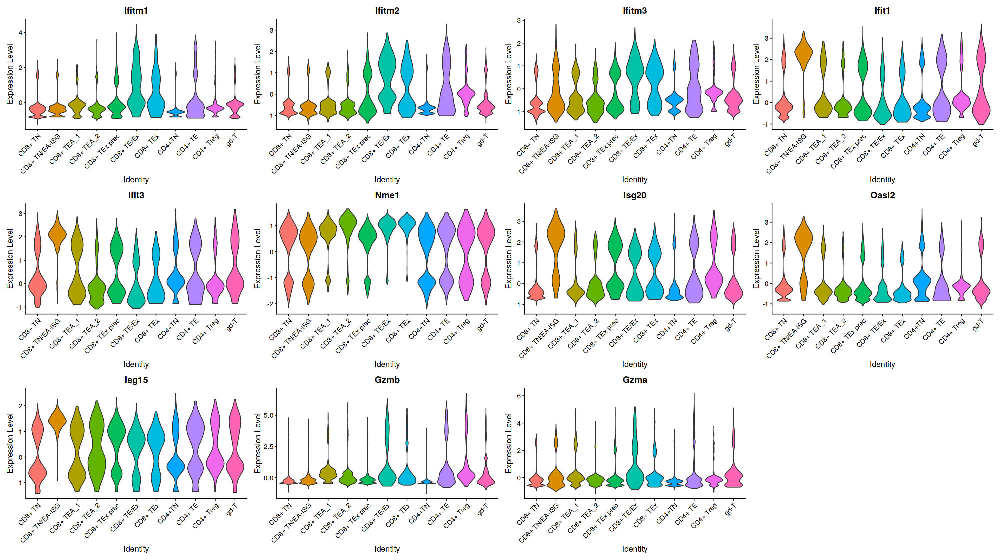

In [241]:
VlnPlot(abc.tcells, features = genes, slot = "scale.data", pt.size = 0)

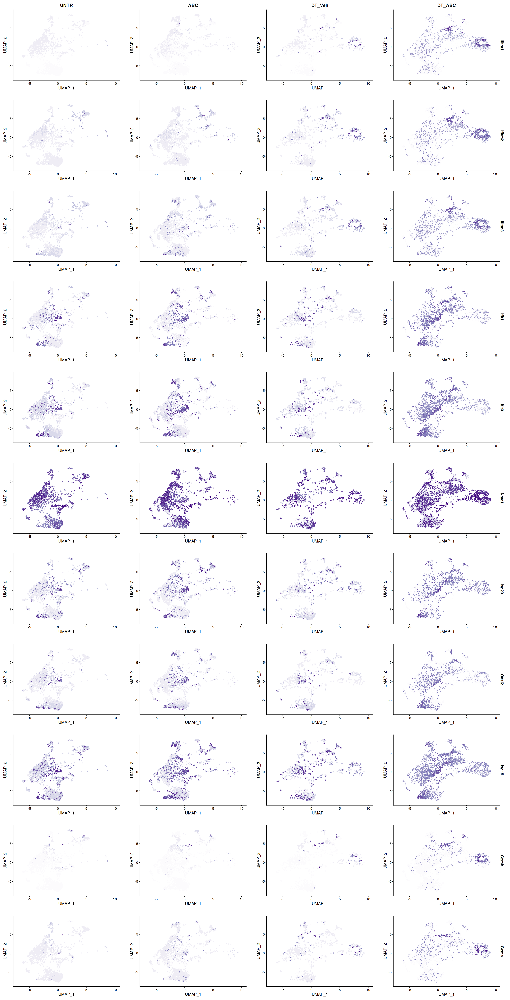

In [243]:
h_ = 49
w_ = 25
options(repr.plot.height=h_, repr.plot.width=w_)
g<-FeaturePlot(abc.tcells.noacd4, features = genes, split.by = 'orig.ident', 
            slot = 'scale.data', label = F, 
            cols =  brewer.pal(n = 9, name = "Purples")) 

for (ext in c('.svg', '.png', '.pdf')){
    fn<-paste0(data_path, 'figures/', 'FeaturePlots_bysample', ext)
    ggsave(fn, g, height = h_, width = w_)}

g

The gini coefficients per context are as follows:

In [244]:
conds<-levels(abc.tcells$orig.ident)[levels(abc.tcells$orig.ident) != 'aCD4_ABC']
combs<-expand.grid(genes, conds)
combs[['Gini']]<-apply(combs, 1, function(x) calc_gini(so = abc.tcells.meta, gene = x[[1]], 
                                                       condition = x[[2]])$gini.coef)
dcast(combs, Var1 ~ Var2)

Using Gini as value column: use value.var to override.



Var1,UNTR,ABC,DT_Veh,DT_ABC
<fct>,<dbl>,<dbl>,<dbl>,<dbl>
Ifitm1,NaN,0.9085006,0.77124745,0.4346794
Ifitm2,0.96603779,0.7425341,0.63897163,0.4486720
Ifitm3,0.83842228,0.5328742,0.43741576,0.3227243
Ifit1,0.53454283,0.5552872,0.49836629,0.2767283
Ifit3,0.55502738,0.6394378,0.35943692,0.2382508
Nme1,0.07156161,0.0857325,0.06617125,0.1223444
Isg20,0.36275638,0.5081983,0.36994449,0.2753974
Oasl2,0.59294531,0.6211296,0.44851623,0.3362749
Isg15,0.29144312,0.4398321,0.22000690,0.1624892


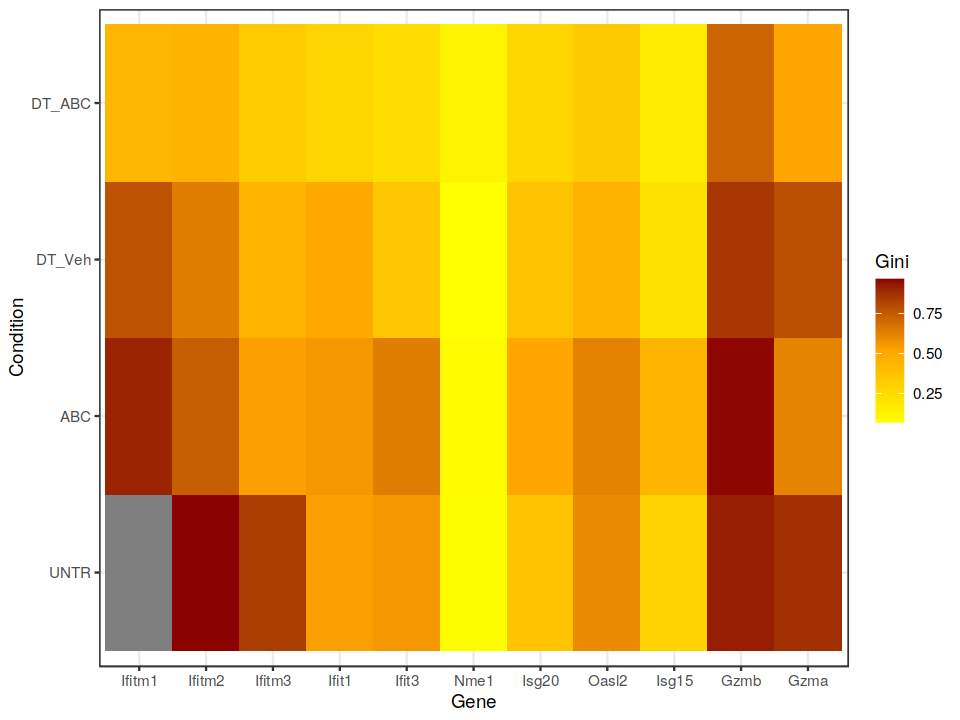

In [247]:
h_ = 6
w_ = 8
options(repr.plot.height=h_, repr.plot.width=w_)
g<-ggplot(combs, aes(x = Var1, y = Var2, fill= Gini)) + geom_tile() + 
scale_fill_gradientn(colours = rev(c("darkred", "orange", "yellow"))) + 
ylab('Condition') + xlab('Gene') + theme_bw()
g

The default behaviour of split.by has changed.
Separate violin plots are now plotted side-by-side.
To restore the old behaviour of a single split violin,
set split.plot = TRUE.
      
This message will be shown once per session.



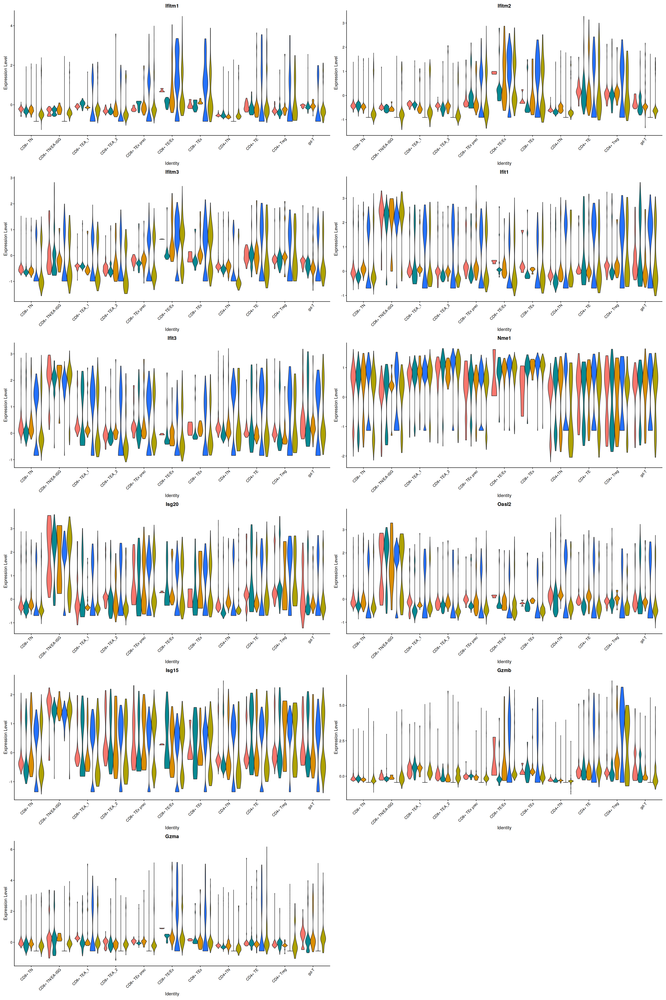

In [248]:
h_ = 45
w_ = 30
options(repr.plot.height=h_, repr.plot.width=w_)
VlnPlot(abc.tcells, features = genes, split.by = 'orig.ident', 
        slot = "scale.data", pt.size = 0, ncol = 2)

<font color='red'>**Top row is integrated, scaled data**</font>

<font color='red'>**Next two rows: Since Siglec1 and Casp1 are not present in the integrated data (not part of HVGs), visualize them instead in the log-normalized scale-data (and also the other genes)**</font>
    


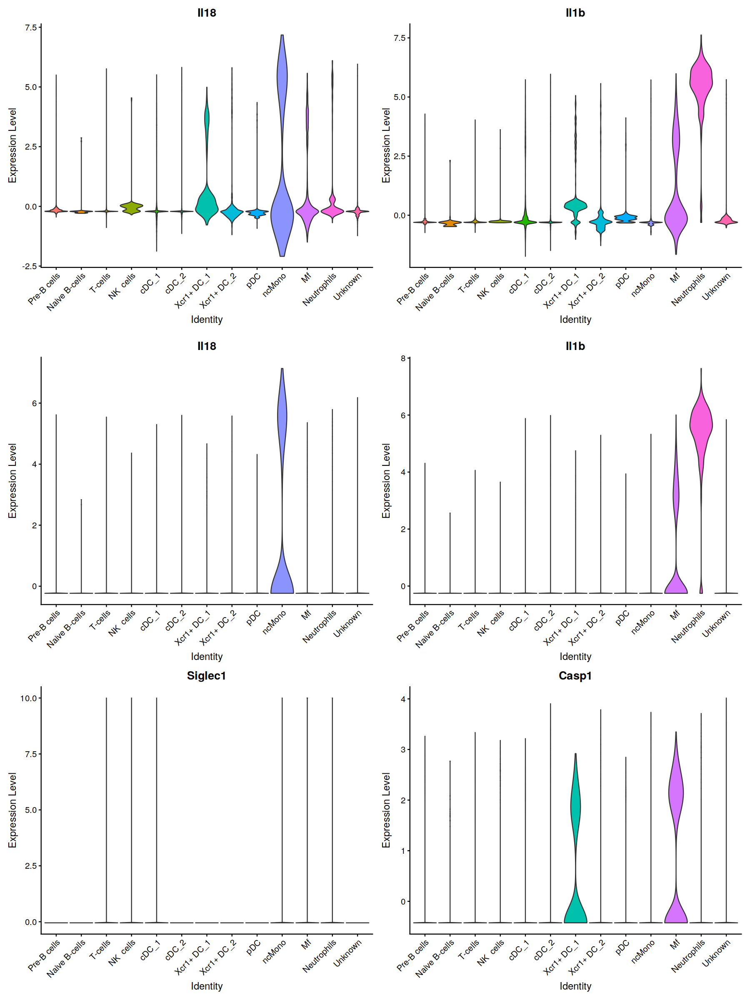

In [131]:
h_ = 20
w_ = 15
options(repr.plot.height=h_, repr.plot.width=w_)

Idents(abc.integrated)<-'Cell.Type.Level1'

var.genes<-c('Il18', 'Il1b')
other.genes<-c('Siglec1', 'Casp1')
g1<-VlnPlot(abc.integrated, features = var.genes, pt.size = 0, ncol = 2, 
           assay = 'integrated', slot = "scale.data")
g2<-VlnPlot(abc.integrated, features = c(var.genes, other.genes), pt.size = 0, ncol = 2, 
           assay = 'RNA', slot = "scale.data")

cowplot::plot_grid(g1, g2, ncol = 1, align = "v", rel_heights = c(1, 2))

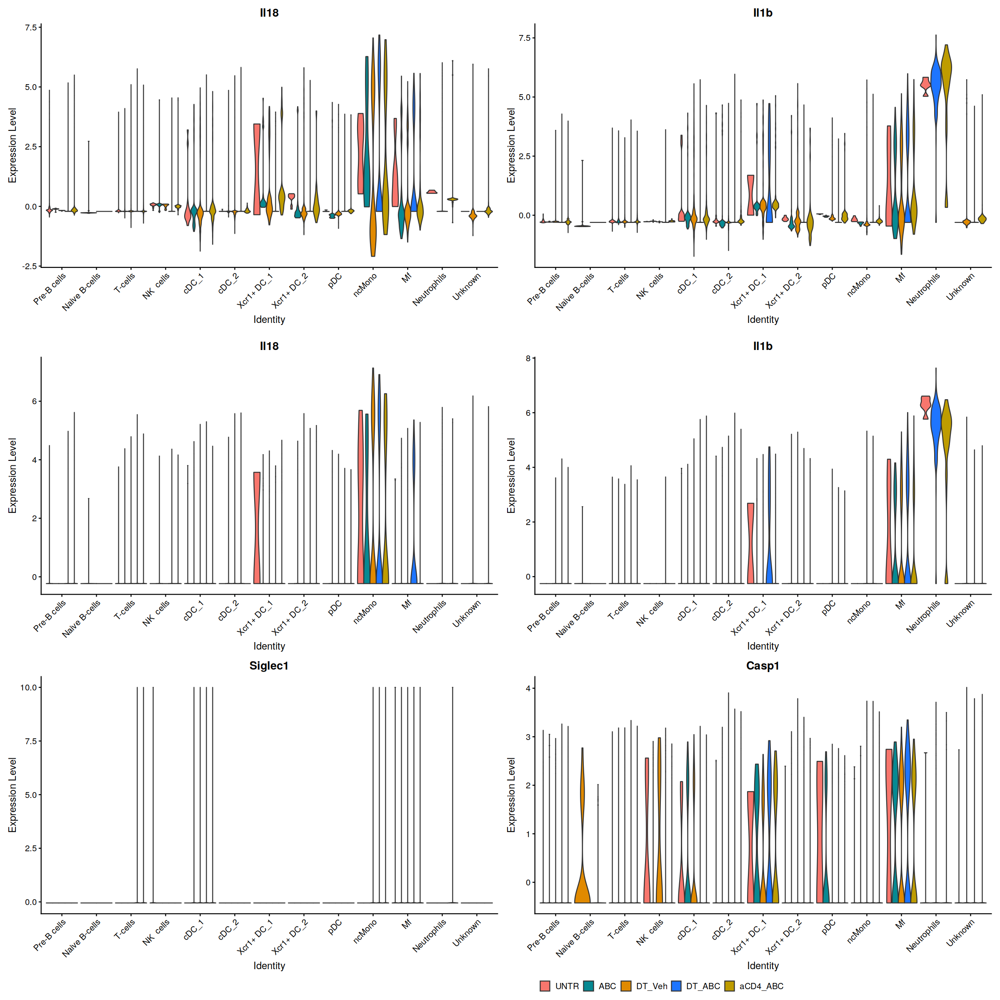

In [142]:
h_ = 20
w_ = 20
options(repr.plot.height=h_, repr.plot.width=w_)

Idents(abc.integrated)<-'Cell.Type.Level1'

var.genes<-c('Il18', 'Il1b')
other.genes<-c('Siglec1', 'Casp1')

suppressWarnings({
    suppressMessages({
        g1<-VlnPlot(abc.integrated, features = var.genes, pt.size = 0, ncol = 2, 
                   assay = 'integrated', slot = "scale.data", split.by = 'orig.ident')
        g2<-VlnPlot(abc.integrated, features = c(var.genes, other.genes), pt.size = 0, ncol = 2, 
                   assay = 'RNA', slot = "scale.data", split.by = 'orig.ident') + theme(legend.position = 'bottom')
        gf<-cowplot::plot_grid(g1, g2, ncol = 1, align = "v", rel_heights = c(1, 2)) 
    })
})


gf